# Gesture Recognition
In this group project, you are going to build a 3D Conv model that will be able to predict the 5 gestures correctly. Please import the following libraries to get started.

## Installers

In [1]:
# !pip install keras
# !pip install tensorflow
# !pip install opencv-python
# !pip install matplotlib

## Import Libraries

In [2]:
import numpy as np
import os
import cv2
from cv2 import imread, resize
import datetime
import os
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

We set the random seed so that the results don't vary drastically.

In [3]:
np.random.seed(30)
import random as rn
rn.seed(30)
from keras import backend as K
import tensorflow as tf
tf.random.set_seed(30)

## Data Load
Read the folder names for training and validation

In [4]:
train_doc = np.random.permutation(open('Project_data/train.csv').readlines())
val_doc = np.random.permutation(open('Project_data/val.csv').readlines())

#In this block, you read the folder names for training and validation. You also set the `batch_size` here. Note that you set the batch size in such a way that you are able to use the GPU in full capacity. You keep increasing the batch size until the machine throws an error.
batch_size = 32 #We will experiment with the batch size

## Data Visualization

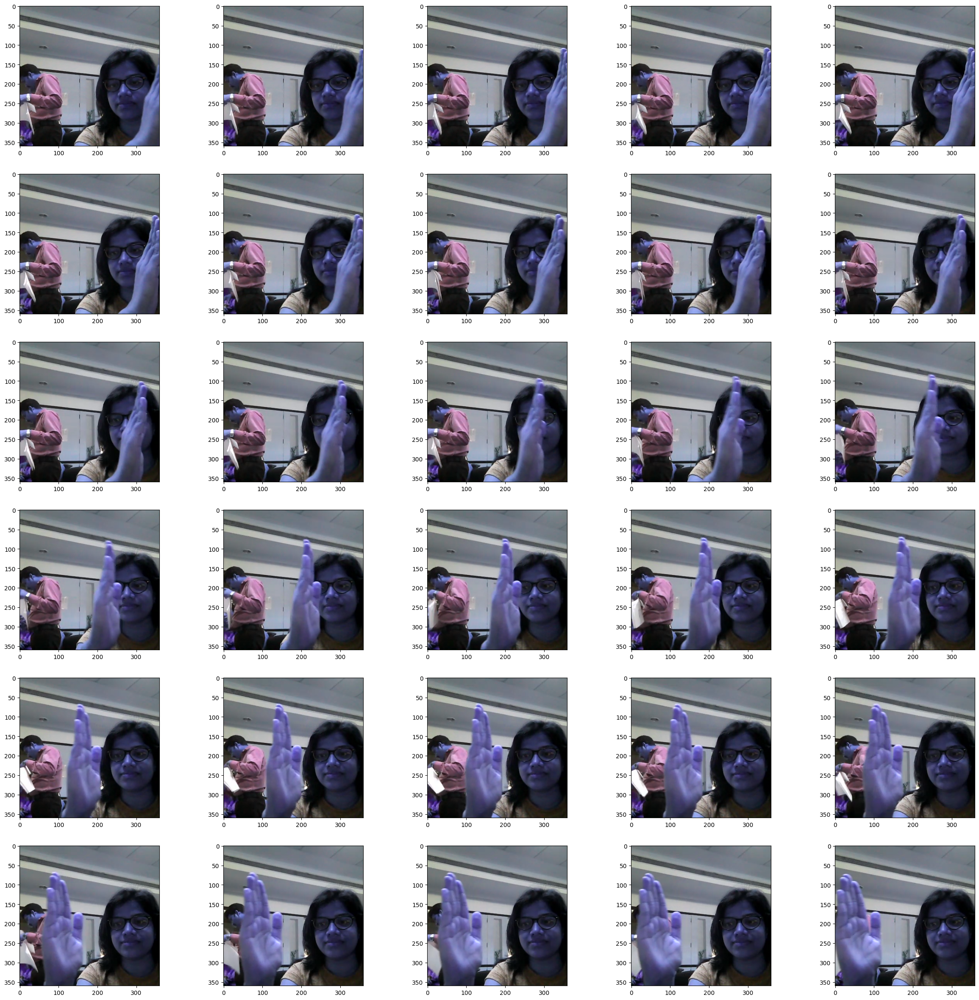

In [5]:
imageset1 = []
for img_path in glob.glob("Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new/*.png"):
        imageset1.append(imread(img_path))

plt.figure(figsize=(30,30))
index = 0
for i, image in enumerate(imageset1):
    index += 1
    plt.subplot(6,5,index)
    plt.imshow(image)

In [6]:
# Resolutions of existing dataset

height, width, channels = imageset1[0].shape

# Print the resolution
print("Image Resolution:")
print("Width:", width)
print("Height:", height)

Image Resolution:
Width: 360
Height: 360


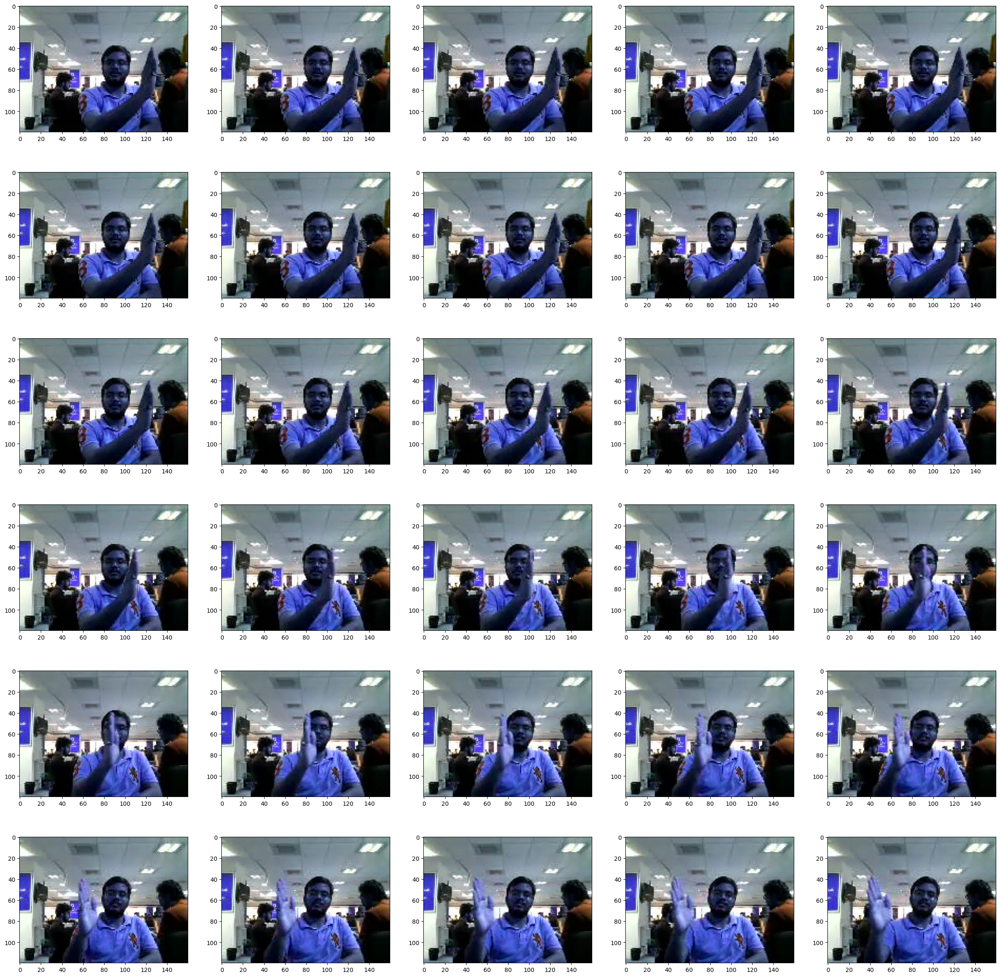

In [7]:
imageset2 = []
for img_path in glob.glob("Project_data/train/WIN_20180926_17_53_03_Pro_Right_Swipe_new/*.png"):
        imageset2.append(imread(img_path))

plt.figure(figsize=(30,30))
index = 0
for i, image in enumerate(imageset2):
    index += 1
    plt.subplot(6,5,index)
    plt.imshow(image)

In [8]:
# Resolutions of existing dataset

height, width, channels = imageset2[0].shape

# Print the resolution
print("Image Resolution:")
print("Width:", width)
print("Height:", height)

Image Resolution:
Width: 160
Height: 120


As we can see, dataset contains images of two different resolutions

## Generator
This is one of the most important part of the code. The overall structure of the generator has been given. 
In the generator, 

you are going to preprocess the images as you have images of 2 different dimensions 

create a batch of video frames. 

You have to experiment with `img_idx`, `y`,`z` and normalization such that you get high accuracy.


`img_idx` - Selecting frames in multiple of three starting from first frame

In [9]:
# Custom function to crop image 

def crop_img(img, scale=1.0):
    center_x, center_y = img.shape[1] / 2, img.shape[0] / 2
    width_scaled, height_scaled = img.shape[1] * scale, img.shape[0] * scale
    left_x, right_x = center_x - width_scaled / 2, center_x + width_scaled / 2
    top_y, bottom_y = center_y - height_scaled / 2, center_y + height_scaled / 2
    img_cropped = img[int(top_y):int(bottom_y), int(left_x):int(right_x)]
    return img_cropped

In [10]:
def generator(source_path, folder_list, batch_size,img_idx, y,z):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    #create a list of image numbers you want to use for a particular video
 
    # x is the number of images you use for each video, (y,z) is the final size of the input images 
    x = len(img_idx)

    while True:
        # Shuffle the training dataset
        t = np.random.permutation(folder_list)

        # calculate the number of batches will depend the volume of data and batch size
        num_batches = int(len(t)/batch_size) 

        print(f"Number of batches {num_batches}") 

        # we iterate over the number of batches
        for batch in range(num_batches): 
            print(f"Runing for batch {batch}")

            # 3 is the number of channels RGB
            batch_data = np.zeros((batch_size,x,y,z,3)) 

            # batch_labels is the one hot representation of the output, as we know from problem statement, there can be 5 possible gestures
            batch_labels = np.zeros((batch_size,5)) 
            
            for folder in range(batch_size): # iterate over the batch_size
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) # read all the images in the folder
                for idx,item in enumerate(img_idx): #  Iterate iver the frames/images of a folder to read them in
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #crop the images by 5% as in few cases the detailing of gesture is going closer to the border line of the frame 
                    image = crop_img(image,0.05)
                    
                    # Resize the images based on their dimension as if rectagular images are resized directly their visual may distort 
                    # and hence ignoring 20 point to render a square image
                    if image.shape[1] == 160:
                        image = cv2.resize(image[:,20:140,:],(y,z),interpolation = cv2.INTER_AREA)
                    else:
                        image = cv2.resize(image,(y,z),interpolation = cv2.INTER_AREA)
                    
                    image = image.astype(np.float32)

                    batch_data[folder,idx,:,:,0] = (image[:,:,0]/255)
                    batch_data[folder,idx,:,:,1] = (image[:,:,1]/255)
                    batch_data[folder,idx,:,:,2] = (image[:,:,2]/255)
                    
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
            yield batch_data, batch_labels #you yield the batch_data and the batch_labels, remember what does yield do

        
        # write the code for the remaining data points which are left after full batches
        if (len(t)%batch_size) != 0:
            # 3 is the number of channels RGB
            batch_data = np.zeros((batch_size,x,y,z,3)) 

            # batch_labels is the one hot representation of the output, as we know from problem statement, there can be 5 possible gestures
            batch_labels = np.zeros((batch_size,5)) 
            
            for folder in range(len(t)%batch_size): # iterate over the remaining batch_size
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) # read all the images in the folder
                for idx,item in enumerate(img_idx): #  Iterate iver the frames/images of a folder to read them in
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #crop the images by 10% as in few cases the detailing of gesture is going closer to the border line of the frame 
                    image = crop_img(image,0.1)
                    
                    # Resize the images based on their dimension as if rectagular images are resized directly their visual may distort 
                    # and hence ignoring 20 point to render a square image
                    if image.shape[1] == 160:
                        image = cv2.resize(image[:,20:140,:],(y,z),interpolation = cv2.INTER_AREA)
                    else:
                        image = cv2.resize(image,(y,z),interpolation = cv2.INTER_AREA).astype(np.float32)

                    batch_data[folder,idx,:,:,0] = (image[:,:,0]/255)
                    batch_data[folder,idx,:,:,1] = (image[:,:,1]/255)
                    batch_data[folder,idx,:,:,2] = (image[:,:,2]/255)
                    
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
            yield batch_data, batch_labels


Note here that a video is represented above in the generator as (number of images, height, width, number of channels). Take this into consideration while creating the model architecture.

In [11]:
curr_dt_time = datetime.datetime.now()
train_path = 'Project_data/train'
val_path = 'Project_data/val'
num_train_sequences = len(train_doc)
print('# training sequences =', num_train_sequences)
num_val_sequences = len(val_doc)
print('# validation sequences =', num_val_sequences)
num_epochs = 3 # choose the number of epochs
print ('# epochs =', num_epochs)

# training sequences = 663
# validation sequences = 100
# epochs = 3


## Model Building
Here you make the model using different functionalities that Keras provides. Remember to use `Conv3D` and `MaxPooling3D` and not `Conv2D` and `Maxpooling2D` for a 3D convolution model. You would want to use `TimeDistributed` while building a Conv2D + RNN model. Also remember that the last layer is the softmax. Design the network in such a way that the model is able to give good accuracy on the least number of parameters so that it can fit in the memory of the webcam.

In [75]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, TimeDistributed, Flatten, BatchNormalization, Activation, Conv3D, MaxPooling3D, Dropout, Conv2D, MaxPooling2D, LSTM
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from keras import optimizers

#### Method definitions
Defining functions to be used for multiple models

In [83]:
def train_model(model,batch_size,img_idx,image_width,image_height,num_epochs):

    # Define model file name and checkpoints 
    model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
        
    if not os.path.exists(model_name):
        os.mkdir(model_name)
            
    filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.weights.h5'

    checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=True, mode='auto')

    LR = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, verbose=1) # write the REducelronplateau code here

    # Using early stopping to stop training when a monitored metric has stopped improving.
    earlystop = EarlyStopping(monitor="val_accuracy",patience=5,mode="max",verbose=1)
    # Preparing callback list
    callbacks_list = [checkpoint, LR, earlystop]

    #Let us create the `train_generator` and the `val_generator` which will be used in `.fit_generator`.
    train_generator = generator(train_path, train_doc, batch_size,img_idx,image_width,image_height)
    val_generator = generator(val_path, val_doc, batch_size,img_idx,image_width,image_height)

    #The `steps_per_epoch` and `validation_steps` are used by `fit_generator` to decide the number of next() calls it need to make.
    if (num_train_sequences%batch_size) == 0:
        steps_per_epoch = int(num_train_sequences/batch_size)
    else:
        steps_per_epoch = (num_train_sequences//batch_size) + 1

    if (num_val_sequences%batch_size) == 0:
        validation_steps = int(num_val_sequences/batch_size)
    else:
        validation_steps = (num_val_sequences//batch_size) + 1

    #Let us now fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.
    history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                                callbacks=callbacks_list, validation_data=val_generator, validation_steps=validation_steps, 
                                class_weight=None, initial_epoch=0)
    
    return history

In [14]:
# Plotting the result of Model :
def plotaccuracy(history):
    # summarize history for accuracy
    plt.plot(history.history['categorical_accuracy'])
    plt.plot(history.history['val_categorical_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

### Model 1 - Convolution 3D


In [16]:
# Choosing hyperparameters for training first model
image_width = 120
image_height = 120

# Frames to be used (Skipping 2 frames in between)
img_idx = [1,4,7,10,13,16,19,21,25,28]
number_ofinput_frames = len(img_idx)

batch_size = 32
num_epochs = 3

In [17]:
# Building the first model which is 3D Conv model:

modelConv3D_1 = Sequential()

modelConv3D_1.add(Conv3D(16, (3,3,3), activation="relu", padding='same', input_shape=(number_ofinput_frames,image_width,image_height,3)))
modelConv3D_1.add(BatchNormalization())
modelConv3D_1.add(MaxPooling3D(pool_size=(2,2,2)))


modelConv3D_1.add(Conv3D(16, (3,3,3), padding='same', activation="relu"))
modelConv3D_1.add(BatchNormalization())
modelConv3D_1.add(MaxPooling3D(pool_size=(2,2,2)))


modelConv3D_1.add(Conv3D(32, (3,3,3), padding='same', activation="relu"))
modelConv3D_1.add(BatchNormalization())
modelConv3D_1.add(MaxPooling3D(pool_size=(2,2,2)))

modelConv3D_1.add(Conv3D(64, (3,3,3), padding='same', activation="relu"))
modelConv3D_1.add(BatchNormalization())
modelConv3D_1.add(MaxPooling3D(pool_size=(2,2,2), padding='same'))

modelConv3D_1.add(Flatten())
modelConv3D_1.add(Dense(64, activation='relu'))
modelConv3D_1.add(Dropout(0.25))

modelConv3D_1.add(Dense(64, activation='relu'))
modelConv3D_1.add(BatchNormalization())
modelConv3D_1.add(Dropout(0.25))

modelConv3D_1.add(Dense(5, activation='softmax'))

#write your optimizer
optimiser = optimizers.Adam(learning_rate=0.001)#, decay=1e-6

# compile model :
modelConv3D_1.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy',"accuracy"])

# Print the model summary :
print (modelConv3D_1.summary())

c:\Users\asthaagarwal\AppData\Local\anaconda3\envs\objectdetection\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv3d (Conv3D)                 │ (None, 10, 120, 120,   │         1,312 │
│                                 │ 16)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 10, 120, 120,   │            64 │
│ (BatchNormalization)            │ 16)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d (MaxPooling3D)    │ (None, 5, 60, 60, 16)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_1 (Conv3D)               │ (None, 5, 60, 60, 16)  │         6,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 5, 60, 60, 16)  │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_1 (MaxPooling3D)  │ (None, 2, 30, 30, 16)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_2 (Conv3D)               │ (None, 2, 30, 30, 32)  │        13,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 2, 30, 30, 32)  │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_2 (MaxPooling3D)  │ (None, 1, 15, 15, 32)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_3 (Conv3D)               │ (None, 1, 15, 15, 64)  │        55,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 1, 15, 15, 64)  │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_3 (MaxPooling3D)  │ (None, 1, 8, 8, 64)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       262,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 344,917 (1.32 MB)

 Trainable params: 344,533 (1.31 MB)

 Non-trainable params: 384 (1.50 KB)

None


In [18]:
# Lets initiate model training
history = train_model(modelConv3D_1,batch_size,img_idx,image_width,image_height,num_epochs)

Source path =  Project_data/train ; batch size = 32
Number of batches 20
Runing for batch 0
Runing for batch 1
Epoch 1/3
 1/21 ━━━━━━━━━━━━━━━━━━━━ 2:36 8s/step - accuracy: 0.3750 - categorical_accuracy: 0.3750 - loss: 2.2953Runing for batch 2
 2/21 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - accuracy: 0.3516 - categorical_accuracy: 0.3516 - loss: 2.2171 Runing for batch 3
 3/21 ━━━━━━━━━━━━━━━━━━━━ 1:17 4s/step - accuracy: 0.3351 - categorical_accuracy: 0.3351 - loss: 2.2010Runing for batch 4
 4/21 ━━━━━━━━━━━━━━━━━━━━ 1:27 5s/step - accuracy: 0.3236 - categorical_accuracy: 0.3236 - loss: 2.1932Runing for batch 5
 5/21 ━━━━━━━━━━━━━━━━━━━━ 1:30 6s/step - accuracy: 0.3164 - categorical_accuracy: 0.3164 - loss: 2.1865Runing for batch 6
 6/21 ━━━━━━━━━━━━━━━━━━━━ 1:26 6s/step - accuracy: 0.3088 - categorical_accuracy: 0.3088 - loss: 2.1848Runing for batch 7
 7/21 ━━━━━━━━━━━━━━━━━━━━ 1:21 6s/step - accuracy: 0.3004 - categorical_accuracy: 0.3004 - loss: 2.1880Runing for batch 8
 8/21 ━━━━━━━━━━━━

In [27]:
print("Validation Accuracy", history.history['val_accuracy'][np.argmin(history.history['val_loss'])])
print("Accuracy", history.history['categorical_accuracy'][np.argmin(history.history['loss'])])

Validation Accuracy 0.171875
Accuracy 0.3452380895614624


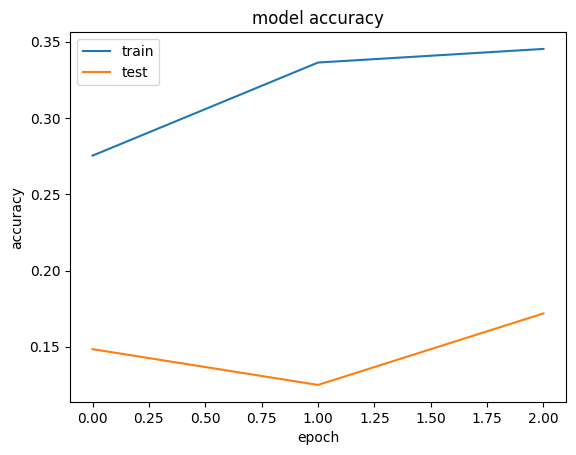

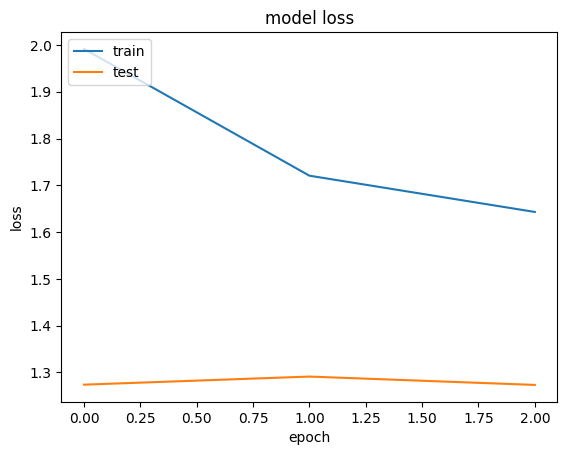

In [21]:
plotaccuracy(history)

As per the accuracy trend, it is clear that model is overfitting to training data, lets try cleaning up data a little and refine the model further

### Model 2 - Convolution 3D

 1. Learning rate 0.0002
 2. Epochs to 20
 3. Image dimension reduced to 100x100


In [33]:
# Choosing hyperparameters 
image_width = 100
image_height = 100

# Frames to be used
img_idx = [1,4,7,10,13,16,19,21,25,28]
number_ofinput_frames = len(img_idx)

batch_size = 32
num_epochs = 20

In [34]:
# Building the first model which is 3D Conv model:

modelConv3D = Sequential()

modelConv3D.add(Conv3D(16, (3,3,3), activation="relu", padding='same', input_shape=(number_ofinput_frames,image_width,image_height,3)))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))


modelConv3D.add(Conv3D(16, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))


modelConv3D.add(Conv3D(32, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))

modelConv3D.add(Conv3D(64, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2), padding='same'))

modelConv3D.add(Flatten())
modelConv3D.add(Dense(64, activation='relu'))
modelConv3D.add(Dropout(0.25))

modelConv3D.add(Dense(64, activation='relu'))
modelConv3D.add(BatchNormalization())
modelConv3D.add(Dropout(0.25))

modelConv3D.add(Dense(5, activation='softmax'))

#write your optimizer
optimiser = optimizers.Adam(learning_rate=0.0002)#, decay=1e-6

# compile model :
modelConv3D.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy',"accuracy"])

# Print the model summary :
print (modelConv3D.summary())

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv3d_8 (Conv3D)               │ (None, 10, 120, 120,   │         1,312 │
│                                 │ 16)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 10, 120, 120,   │            64 │
│ (BatchNormalization)            │ 16)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_8 (MaxPooling3D)  │ (None, 5, 60, 60, 16)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_9 (Conv3D)               │ (None, 5, 60, 60, 16)  │         6,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 5, 60, 60, 16)  │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_9 (MaxPooling3D)  │ (None, 2, 30, 30, 16)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_10 (Conv3D)              │ (None, 2, 30, 30, 32)  │        13,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 2, 30, 30, 32)  │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_10 (MaxPooling3D) │ (None, 1, 15, 15, 32)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_11 (Conv3D)              │ (None, 1, 15, 15, 64)  │        55,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 1, 15, 15, 64)  │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_11 (MaxPooling3D) │ (None, 1, 8, 8, 64)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │       262,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 344,917 (1.32 MB)

 Trainable params: 344,533 (1.31 MB)

 Non-trainable params: 384 (1.50 KB)

None


In [35]:
# Lets initiate model training
history2 = train_model(modelConv3D,batch_size,img_idx,image_width,image_height,num_epochs)

Source path =  Project_data/train ; batch size = 32
Number of batches 20
Runing for batch 0


Runing for batch 1
Epoch 1/20
 1/21 ━━━━━━━━━━━━━━━━━━━━ 2:51 9s/step - accuracy: 0.1250 - categorical_accuracy: 0.1250 - loss: 2.1614Runing for batch 2
 2/21 ━━━━━━━━━━━━━━━━━━━━ 24s 1s/step - accuracy: 0.1719 - categorical_accuracy: 0.1719 - loss: 2.1855 Runing for batch 3
 3/21 ━━━━━━━━━━━━━━━━━━━━ 1:47 6s/step - accuracy: 0.2014 - categorical_accuracy: 0.2014 - loss: 2.2041Runing for batch 4
 4/21 ━━━━━━━━━━━━━━━━━━━━ 2:06 7s/step - accuracy: 0.2116 - categorical_accuracy: 0.2116 - loss: 2.2024Runing for batch 5
 5/21 ━━━━━━━━━━━━━━━━━━━━ 2:09 8s/step - accuracy: 0.2193 - categorical_accuracy: 0.2193 - loss: 2.1799Runing for batch 6
 6/21 ━━━━━━━━━━━━━━━━━━━━ 2:07 8s/step - accuracy: 0.2261 - categorical_accuracy: 0.2261 - loss: 2.1623Runing for batch 7
 7/21 ━━━━━━━━━━━━━━━━━━━━ 2:02 9s/step - accuracy: 0.2315 - categorical_accuracy: 0.2315 - loss: 2.1476Runing for batch 8
 8/21 ━━━━━━━━━━━━━━━━━━━━ 1:54 9s/step - accuracy: 0.2343 - categorical_accuracy: 0.2343 - loss: 2.1405Runin

In [36]:
print("Validation Accuracy", history2.history['val_accuracy'][np.argmin(history2.history['val_loss'])])
print("Accuracy", history2.history['categorical_accuracy'][np.argmin(history2.history['loss'])])

Validation Accuracy 0.1640625
Accuracy 0.4285714328289032


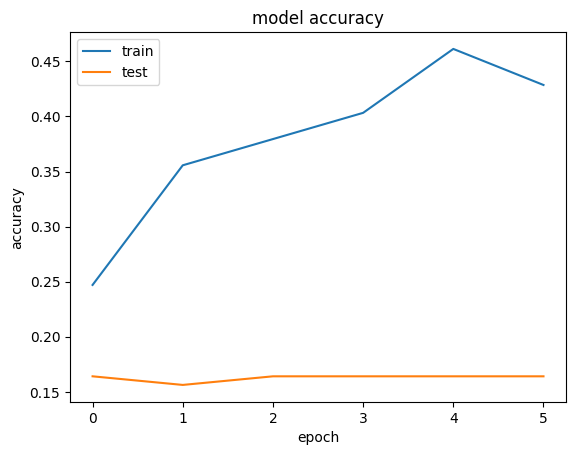

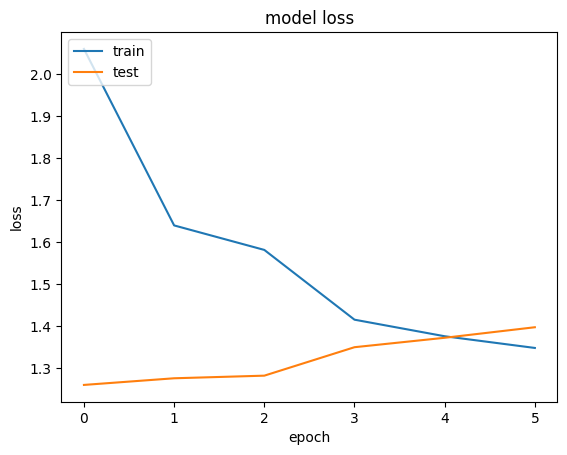

In [37]:
plotaccuracy(history2)

### Model 3 - Convolution 3D

 1. Changing frame selection to 18, few frames from start and end and more frames from middle
 2. Epochs to 20
 3. Reduced image dimesnsions to 84x84
 4. Learning rate as 0.001


In [38]:
image_width = 84
image_height = 84
img_idx = [0,4,10,12,14,16,17,18,19,20,21,22,23,24,25,26,28,29]#[1,4,7,10,13,16,19,21,25,28]
number_ofinput_frames = len(img_idx)
batch_size = 32
num_epochs = 20
learning_rate = 0.001

In [39]:
# Building the first model which is 3D Conv model:

modelConv3D = Sequential()

modelConv3D.add(Conv3D(16, (3,3,3), activation="relu", padding='same', input_shape=(number_ofinput_frames,image_width,image_height,3)))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))


modelConv3D.add(Conv3D(16, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))


modelConv3D.add(Conv3D(32, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))

modelConv3D.add(Conv3D(64, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2), padding='same'))

modelConv3D.add(Flatten())
modelConv3D.add(Dense(64, activation='relu'))
modelConv3D.add(Dropout(0.25))

modelConv3D.add(Dense(64, activation='relu'))
modelConv3D.add(BatchNormalization())
modelConv3D.add(Dropout(0.25))

modelConv3D.add(Dense(5, activation='softmax'))

#write your optimizer
optimiser = optimizers.Adam(learning_rate=learning_rate)#, decay=1e-6

# compile model :
modelConv3D.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy',"accuracy"])

# Print the model summary :
print (modelConv3D.summary())

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv3d_12 (Conv3D)              │ (None, 18, 84, 84, 16) │         1,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 18, 84, 84, 16) │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_12 (MaxPooling3D) │ (None, 9, 42, 42, 16)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_13 (Conv3D)              │ (None, 9, 42, 42, 16)  │         6,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 9, 42, 42, 16)  │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_13 (MaxPooling3D) │ (None, 4, 21, 21, 16)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_14 (Conv3D)              │ (None, 4, 21, 21, 32)  │        13,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 4, 21, 21, 32)  │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_14 (MaxPooling3D) │ (None, 2, 10, 10, 32)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_15 (Conv3D)              │ (None, 2, 10, 10, 64)  │        55,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 2, 10, 10, 64)  │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_15 (MaxPooling3D) │ (None, 1, 5, 5, 64)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 1600)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 64)             │       102,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_19          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 185,173 (723.33 KB)

 Trainable params: 184,789 (721.83 KB)

 Non-trainable params: 384 (1.50 KB)

None


In [40]:
# Lets initiate model training
history3 = train_model(modelConv3D,batch_size,img_idx,image_width,image_height,num_epochs)

Source path =  Project_data/train ; batch size = 32
Number of batches 20
Runing for batch 0
Runing for batch 1
Epoch 1/20
 1/21 ━━━━━━━━━━━━━━━━━━━━ 3:06 9s/step - accuracy: 0.2188 - categorical_accuracy: 0.2188 - loss: 2.2476Runing for batch 2
 2/21 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - accuracy: 0.1953 - categorical_accuracy: 0.1953 - loss: 2.3453 Runing for batch 3
 3/21 ━━━━━━━━━━━━━━━━━━━━ 2:26 8s/step - accuracy: 0.1962 - categorical_accuracy: 0.1962 - loss: 2.3609Runing for batch 4
 4/21 ━━━━━━━━━━━━━━━━━━━━ 3:11 11s/step - accuracy: 0.1940 - categorical_accuracy: 0.1940 - loss: 2.3652Runing for batch 5
 5/21 ━━━━━━━━━━━━━━━━━━━━ 3:24 13s/step - accuracy: 0.1952 - categorical_accuracy: 0.1952 - loss: 2.3593Runing for batch 6
 6/21 ━━━━━━━━━━━━━━━━━━━━ 3:22 14s/step - accuracy: 0.1957 - categorical_accuracy: 0.1957 - loss: 2.3538Runing for batch 7
 7/21 ━━━━━━━━━━━━━━━━━━━━ 3:11 14s/step - accuracy: 0.1983 - categorical_accuracy: 0.1983 - loss: 2.3459Runing for batch 8
 8/21 ━━━━━━━

In [41]:
print("Validation Accuracy", history3.history['val_accuracy'][np.argmin(history3.history['val_loss'])])
print("Accuracy", history3.history['categorical_accuracy'][np.argmin(history3.history['loss'])])

Validation Accuracy 0.203125
Accuracy 0.4136904776096344


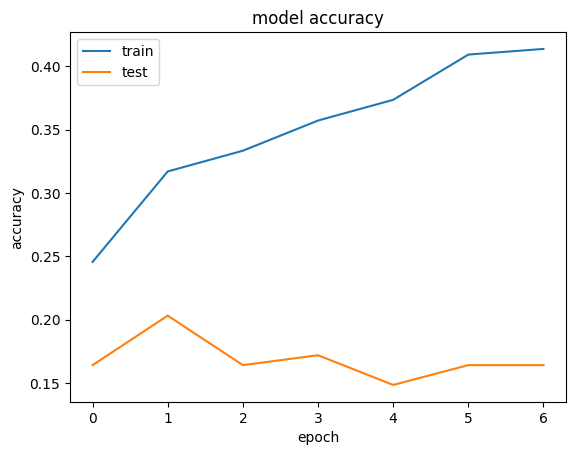

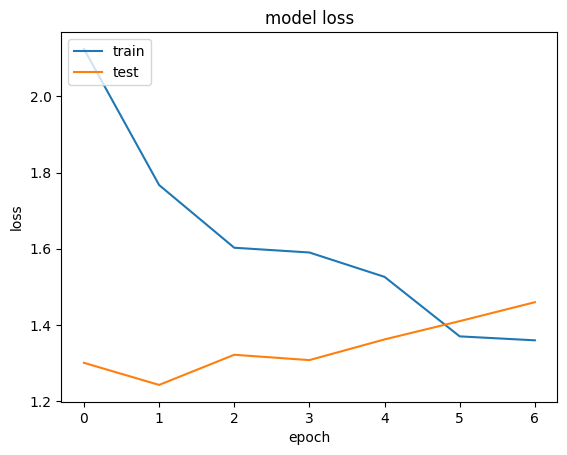

In [42]:
plotaccuracy(history3)

As you can see, though training accuracy dropped slightly but there is a significant jump in validation accuracy, hence the number of frames and frame size reduction seems to show positive impact on the model

### Model 4 - Convolution 3D

Changing frame selection to 25


In [47]:
image_width = 84
image_height = 84
img_idx = [0,2,4,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,26,28,29]
number_ofinput_frames = len(img_idx)
batch_size = 24
num_epochs = 20
learning_rate = 0.001

In [48]:
# Building the first model which is 3D Conv model:

modelConv3D = Sequential()

modelConv3D.add(Conv3D(16, (3,3,3), activation="relu", padding='same', input_shape=(number_ofinput_frames,image_width,image_height,3)))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))


modelConv3D.add(Conv3D(16, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))


modelConv3D.add(Conv3D(32, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))

modelConv3D.add(Conv3D(64, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2), padding='same'))

modelConv3D.add(Flatten())
modelConv3D.add(Dense(64, activation='relu'))
modelConv3D.add(Dropout(0.25))

modelConv3D.add(Dense(64, activation='relu'))
modelConv3D.add(BatchNormalization())
modelConv3D.add(Dropout(0.25))

modelConv3D.add(Dense(5, activation='softmax'))

#write your optimizer
optimiser = optimizers.Adam(learning_rate=learning_rate)#, decay=1e-6

# compile model :
modelConv3D.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy',"accuracy"])

In [49]:
# Lets initiate model training
history4 = train_model(modelConv3D,batch_size,img_idx,image_width,image_height,num_epochs)

Source path =  Project_data/train ; batch size = 24
Number of batches 27
Runing for batch 0
Runing for batch 1
Epoch 1/20
 1/28 ━━━━━━━━━━━━━━━━━━━━ 2:55 6s/step - accuracy: 0.0833 - categorical_accuracy: 0.0833 - loss: 2.7211Runing for batch 2
 2/28 ━━━━━━━━━━━━━━━━━━━━ 32s 1s/step - accuracy: 0.1146 - categorical_accuracy: 0.1146 - loss: 2.5425 Runing for batch 3
 3/28 ━━━━━━━━━━━━━━━━━━━━ 1:29 4s/step - accuracy: 0.1366 - categorical_accuracy: 0.1366 - loss: 2.4632Runing for batch 4
 4/28 ━━━━━━━━━━━━━━━━━━━━ 1:44 4s/step - accuracy: 0.1649 - categorical_accuracy: 0.1649 - loss: 2.3907Runing for batch 5
 5/28 ━━━━━━━━━━━━━━━━━━━━ 1:48 5s/step - accuracy: 0.1769 - categorical_accuracy: 0.1769 - loss: 2.3543Runing for batch 6
 6/28 ━━━━━━━━━━━━━━━━━━━━ 1:49 5s/step - accuracy: 0.1856 - categorical_accuracy: 0.1856 - loss: 2.3259Runing for batch 7
 7/28 ━━━━━━━━━━━━━━━━━━━━ 1:47 5s/step - accuracy: 0.1914 - categorical_accuracy: 0.1914 - loss: 2.2976Runing for batch 8
 8/28 ━━━━━━━━━━━

In [51]:
print("Validation Accuracy", history4.history['val_accuracy'][np.argmin(history4.history['val_loss'])])
print("Accuracy", history4.history['categorical_accuracy'][np.argmin(history4.history['loss'])])

Validation Accuracy 0.1666666716337204
Accuracy 0.431547611951828


Processing time increased with increase in number of frames, also as we can see there is an increase in accuracy level for training data, but validation accuracy dropped, so keeping number of frames between 18-20

### Model 5 - Convolution 3D

1. Changing learning rate as 0.0002
2. Number of frames to 20

In [52]:
image_width = 84
image_height = 84
img_idx = [0,4,10,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,28,29]
number_ofinput_frames = len(img_idx)
batch_size = 24
num_epochs = 20
learning_rate = 0.0002

In [53]:
# Building the first model which is 3D Conv model:

modelConv3D = Sequential()

modelConv3D.add(Conv3D(16, (3,3,3), activation="relu", padding='same', input_shape=(number_ofinput_frames,image_width,image_height,3)))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))


modelConv3D.add(Conv3D(16, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))


modelConv3D.add(Conv3D(32, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))

modelConv3D.add(Conv3D(64, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2), padding='same'))

modelConv3D.add(Flatten())
modelConv3D.add(Dense(64, activation='relu'))
modelConv3D.add(Dropout(0.25))

modelConv3D.add(Dense(64, activation='relu'))
modelConv3D.add(BatchNormalization())
modelConv3D.add(Dropout(0.25))

modelConv3D.add(Dense(5, activation='softmax'))

#write your optimizer
optimiser = optimizers.Adam(learning_rate=learning_rate)#, decay=1e-6

# compile model :
modelConv3D.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy',"accuracy"])

c:\Users\asthaagarwal\AppData\Local\anaconda3\envs\objectdetection\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


In [54]:
# Lets initiate model training
history5 = train_model(modelConv3D,batch_size,img_idx,image_width,image_height,num_epochs)

Source path =  Project_data/train ; batch size = 24
Number of batches 27
Runing for batch 0
Runing for batch 1
Epoch 1/20
 1/28 ━━━━━━━━━━━━━━━━━━━━ 3:34 8s/step - accuracy: 0.2083 - categorical_accuracy: 0.2083 - loss: 2.3584Runing for batch 2
 2/28 ━━━━━━━━━━━━━━━━━━━━ 32s 1s/step - accuracy: 0.1875 - categorical_accuracy: 0.1875 - loss: 2.3705 Runing for batch 3
 3/28 ━━━━━━━━━━━━━━━━━━━━ 2:24 6s/step - accuracy: 0.1806 - categorical_accuracy: 0.1806 - loss: 2.3724Runing for batch 4
 4/28 ━━━━━━━━━━━━━━━━━━━━ 2:52 7s/step - accuracy: 0.1875 - categorical_accuracy: 0.1875 - loss: 2.3648Runing for batch 5
 5/28 ━━━━━━━━━━━━━━━━━━━━ 3:10 8s/step - accuracy: 0.1950 - categorical_accuracy: 0.1950 - loss: 2.3354Runing for batch 6
 6/28 ━━━━━━━━━━━━━━━━━━━━ 3:09 9s/step - accuracy: 0.2007 - categorical_accuracy: 0.2007 - loss: 2.3214Runing for batch 7
 7/28 ━━━━━━━━━━━━━━━━━━━━ 3:05 9s/step - accuracy: 0.2043 - categorical_accuracy: 0.2043 - loss: 2.3051Runing for batch 8
 8/28 ━━━━━━━━━━━

In [56]:
print("Total Params:", modelConv3D.count_params())

Total Params: 185173


In [55]:
print("Validation Accuracy", history5.history['val_accuracy'][np.argmin(history5.history['val_loss'])])
print("Accuracy", history5.history['categorical_accuracy'][np.argmin(history5.history['loss'])])

Validation Accuracy 0.13333334028720856
Accuracy 0.4404761791229248


As observed, accuracy of validation dataset went further low, hence using the best params till now and try refining the model layers

### Model 6 - Convolution 3D

 1. Changing the number of dimensions of layers


In [57]:
image_width = 84
image_height = 84
img_idx = [0,4,10,12,14,16,17,18,19,20,21,22,23,24,25,26,28,29]
number_ofinput_frames = len(img_idx)
batch_size = 32
num_epochs = 20
learning_rate = 0.001 

In [58]:
# Building the first model which is 3D Conv model:

modelConv3D = Sequential()

modelConv3D.add(Conv3D(16, (3,3,3), activation="relu", padding='same', input_shape=(number_ofinput_frames,image_width,image_height,3)))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))


modelConv3D.add(Conv3D(32, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))


modelConv3D.add(Conv3D(64, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))

modelConv3D.add(Conv3D(128, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2), padding='same'))

modelConv3D.add(Flatten())
modelConv3D.add(Dense(64, activation='relu'))
modelConv3D.add(Dropout(0.25))

modelConv3D.add(Dense(64, activation='relu'))
modelConv3D.add(BatchNormalization())
modelConv3D.add(Dropout(0.25))

modelConv3D.add(Dense(5, activation='softmax'))

#write your optimizer
optimiser = optimizers.Adam(learning_rate=learning_rate)#, decay=1e-6

# compile model :
modelConv3D.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy',"accuracy"])

# Print the model summary :
print (modelConv3D.summary())

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv3d_28 (Conv3D)              │ (None, 18, 84, 84, 16) │         1,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_35          │ (None, 18, 84, 84, 16) │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_28 (MaxPooling3D) │ (None, 9, 42, 42, 16)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_29 (Conv3D)              │ (None, 9, 42, 42, 32)  │        13,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_36          │ (None, 9, 42, 42, 32)  │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_29 (MaxPooling3D) │ (None, 4, 21, 21, 32)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_30 (Conv3D)              │ (None, 4, 21, 21, 64)  │        55,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_37          │ (None, 4, 21, 21, 64)  │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_30 (MaxPooling3D) │ (None, 2, 10, 10, 64)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_31 (Conv3D)              │ (None, 2, 10, 10, 128) │       221,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_38          │ (None, 2, 10, 10, 128) │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_31 (MaxPooling3D) │ (None, 1, 5, 5, 128)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 64)             │       204,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_39          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 502,405 (1.92 MB)

 Trainable params: 501,797 (1.91 MB)

 Non-trainable params: 608 (2.38 KB)

None


In [59]:
print("Total Params:", modelConv3D.count_params())

Total Params: 502405


In [61]:
# Lets initiate model training
history6 = train_model(modelConv3D,batch_size,img_idx,image_width,image_height,num_epochs)

Source path =  Project_data/train ; batch size = 32
Number of batches 20
Runing for batch 0
Runing for batch 1
Epoch 1/20
 1/21 ━━━━━━━━━━━━━━━━━━━━ 3:56 12s/step - accuracy: 0.3438 - categorical_accuracy: 0.3438 - loss: 1.5595Runing for batch 2
 2/21 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.3359 - categorical_accuracy: 0.3359 - loss: 1.6402  Runing for batch 3
 3/21 ━━━━━━━━━━━━━━━━━━━━ 2:27 8s/step - accuracy: 0.3177 - categorical_accuracy: 0.3177 - loss: 1.7592Runing for batch 4
 4/21 ━━━━━━━━━━━━━━━━━━━━ 2:45 10s/step - accuracy: 0.3008 - categorical_accuracy: 0.3008 - loss: 1.8477Runing for batch 5
 5/21 ━━━━━━━━━━━━━━━━━━━━ 2:44 10s/step - accuracy: 0.2881 - categorical_accuracy: 0.2881 - loss: 1.8960Runing for batch 6
 6/21 ━━━━━━━━━━━━━━━━━━━━ 2:44 11s/step - accuracy: 0.2800 - categorical_accuracy: 0.2800 - loss: 1.9249Runing for batch 7
 7/21 ━━━━━━━━━━━━━━━━━━━━ 2:35 11s/step - accuracy: 0.2757 - categorical_accuracy: 0.2757 - loss: 1.9381Runing for batch 8
 8/21 ━━━━━

In [62]:
print("Validation Accuracy", history6.history['val_accuracy'][np.argmin(history6.history['val_loss'])])
print("Accuracy", history6.history['categorical_accuracy'][np.argmin(history6.history['loss'])])

Validation Accuracy 0.1796875
Accuracy 0.3854166567325592


### Model 7 - Convolution 3D

 1. Changing the number of dimensions of layers


In [63]:
image_width = 84
image_height = 84
img_idx = [0,4,10,12,14,16,17,18,19,20,21,22,23,24,25,26,28,29]
number_ofinput_frames = len(img_idx)
batch_size = 32
num_epochs = 25
learning_rate = 0.001

In [70]:
# Building the first model which is 3D Conv model:

modelConv3D = Sequential()

modelConv3D.add(Conv3D(8, (3,3,3), activation="relu", padding='same', input_shape=(number_ofinput_frames,image_width,image_height,3)))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))


modelConv3D.add(Conv3D(16, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))


modelConv3D.add(Conv3D(32, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2)))

modelConv3D.add(Conv3D(64, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2), padding='same'))

modelConv3D.add(Conv3D(128, (3,3,3), padding='same', activation="relu"))
modelConv3D.add(BatchNormalization())
modelConv3D.add(MaxPooling3D(pool_size=(2,2,2), padding='same'))

modelConv3D.add(Flatten())
modelConv3D.add(Dense(64, activation='relu'))
modelConv3D.add(Dropout(0.25))

modelConv3D.add(Dense(64, activation='relu'))
modelConv3D.add(BatchNormalization())
modelConv3D.add(Dropout(0.25))

modelConv3D.add(Dense(5, activation='softmax'))

#write your optimizer
optimiser = optimizers.Adam(learning_rate=learning_rate)#, decay=1e-6

# compile model :
modelConv3D.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy',"accuracy"])

# Print the model summary :
print (modelConv3D.summary())

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv3d_53 (Conv3D)              │ (None, 18, 84, 84, 8)  │           656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_64          │ (None, 18, 84, 84, 8)  │            32 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_53 (MaxPooling3D) │ (None, 9, 42, 42, 8)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_54 (Conv3D)              │ (None, 9, 42, 42, 16)  │         3,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_65          │ (None, 9, 42, 42, 16)  │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_54 (MaxPooling3D) │ (None, 4, 21, 21, 16)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_55 (Conv3D)              │ (None, 4, 21, 21, 32)  │        13,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_66          │ (None, 4, 21, 21, 32)  │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_55 (MaxPooling3D) │ (None, 2, 10, 10, 32)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_56 (Conv3D)              │ (None, 2, 10, 10, 64)  │        55,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_67          │ (None, 2, 10, 10, 64)  │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_56 (MaxPooling3D) │ (None, 1, 5, 5, 64)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_57 (Conv3D)              │ (None, 1, 5, 5, 128)   │       221,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_68          │ (None, 1, 5, 5, 128)   │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_57 (MaxPooling3D) │ (None, 1, 3, 3, 128)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_11 (Flatten)            │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 64)             │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_69          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_23 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 5)              │           32

 Total params: 374,181 (1.43 MB)

 Trainable params: 373,557 (1.43 MB)

 Non-trainable params: 624 (2.44 KB)

None


In [71]:
# Lets initiate model training
history6 = train_model(modelConv3D,batch_size,img_idx,image_width,image_height,num_epochs)

Source path =  Project_data/train ; batch size = 32
Number of batches 20
Runing for batch 0
Runing for batch 1
Epoch 1/25
 1/21 ━━━━━━━━━━━━━━━━━━━━ 3:09 9s/step - accuracy: 0.1250 - categorical_accuracy: 0.1250 - loss: 2.5076Runing for batch 2
 2/21 ━━━━━━━━━━━━━━━━━━━━ 24s 1s/step - accuracy: 0.1484 - categorical_accuracy: 0.1484 - loss: 2.4376 Runing for batch 3
 3/21 ━━━━━━━━━━━━━━━━━━━━ 2:08 7s/step - accuracy: 0.1684 - categorical_accuracy: 0.1684 - loss: 2.3808Runing for batch 4
 4/21 ━━━━━━━━━━━━━━━━━━━━ 2:22 8s/step - accuracy: 0.1810 - categorical_accuracy: 0.1810 - loss: 2.3435Runing for batch 5
 5/21 ━━━━━━━━━━━━━━━━━━━━ 2:34 10s/step - accuracy: 0.1898 - categorical_accuracy: 0.1898 - loss: 2.3214Runing for batch 6
 6/21 ━━━━━━━━━━━━━━━━━━━━ 2:32 10s/step - accuracy: 0.1981 - categorical_accuracy: 0.1981 - loss: 2.2944Runing for batch 7
 7/21 ━━━━━━━━━━━━━━━━━━━━ 2:31 11s/step - accuracy: 0.2042 - categorical_accuracy: 0.2042 - loss: 2.2757Runing for batch 8
 8/21 ━━━━━━━━

In [72]:
print("Validation Accuracy", history6.history['val_accuracy'][np.argmin(history6.history['val_loss'])])
print("Accuracy", history6.history['categorical_accuracy'][np.argmin(history6.history['loss'])])

Validation Accuracy 0.15625
Accuracy 0.4285714328289032


We have tried multiple experiments with Conv 3D model but the performance of models are not as expected, so lets try with the other models for the same problem statement.

### Model 8 - CNN + LSTM

In [79]:
image_width = 84
image_height = 84
img_idx = [0,4,10,12,14,16,17,18,19,20,21,22,23,24,25,26,28,29]
number_ofinput_frames = len(img_idx)
batch_size = 32
num_epochs = 25
learning_rate = 0.001

In [80]:
input_shape = (number_ofinput_frames,image_width,image_height,3)

In [84]:
#write your model here
CNNlstm_1 = Sequential()

CNNlstm_1.add(TimeDistributed(Conv2D(16, (3, 3) , padding='same', activation='relu'),
                          input_shape=input_shape))
CNNlstm_1.add(TimeDistributed(BatchNormalization()))
CNNlstm_1.add(TimeDistributed(MaxPooling2D((2, 2))))

CNNlstm_1.add(TimeDistributed(Conv2D(32, (3, 3) , padding='same', activation='relu')))
CNNlstm_1.add(TimeDistributed(BatchNormalization()))
CNNlstm_1.add(TimeDistributed(MaxPooling2D((2, 2))))

CNNlstm_1.add(TimeDistributed(Conv2D(64, (3, 3) , padding='same', activation='relu')))
CNNlstm_1.add(TimeDistributed(BatchNormalization()))
CNNlstm_1.add(TimeDistributed(MaxPooling2D((2, 2))))

CNNlstm_1.add(TimeDistributed(Conv2D(128, (3, 3) , padding='same', activation='relu')))
CNNlstm_1.add(TimeDistributed(BatchNormalization()))
CNNlstm_1.add(TimeDistributed(MaxPooling2D((2, 2))))

CNNlstm_1.add(TimeDistributed(Conv2D(256, (3, 3) , padding='same', activation='relu')))
CNNlstm_1.add(TimeDistributed(BatchNormalization()))
CNNlstm_1.add(TimeDistributed(MaxPooling2D((2, 2))))

CNNlstm_1.add(TimeDistributed(Flatten()))


CNNlstm_1.add(LSTM(128))
CNNlstm_1.add(Dropout(0.25))

CNNlstm_1.add(Dense(128,activation='relu'))
CNNlstm_1.add(Dropout(0.25))

CNNlstm_1.add(Dense(5, activation='softmax'))


#write your optimizer
optimiser = optimizers.Adam()
#optimiser = 
#sgd = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.7, nesterov=True)

# compile model :
CNNlstm_1.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy',"accuracy"])
print (CNNlstm_1.summary())

c:\Users\asthaagarwal\AppData\Local\anaconda3\envs\objectdetection\Lib\site-packages\keras\src\layers\core\wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ time_distributed_32             │ (None, 18, 84, 84, 16) │           448 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_33             │ (None, 18, 84, 84, 16) │            64 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_34             │ (None, 18, 42, 42, 16) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_35             │ (None, 18, 42, 42, 32) │         4,640 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_36             │ (None, 18, 42, 42, 32) │           128 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_37             │ (None, 18, 21, 21, 32) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_38             │ (None, 18, 21, 21, 64) │        18,496 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_39             │ (None, 18, 21, 21, 64) │           256 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_40             │ (None, 18, 10, 10, 64) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_41             │ (None, 18, 10, 10,     │        73,856 │
│ (TimeDistributed)               │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_42             │ (None, 18, 10, 10,     │           512 │
│ (TimeDistributed)               │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_43             │ (None, 18, 5, 5, 128)  │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_44             │ (None, 18, 5, 5, 256)  │       295,168 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_45             │ (None, 18, 5, 5, 256)  │         1,024 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_46             │ (None, 18, 2, 2, 256)  │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_47             │ (None, 18, 1024)       │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 128)            │       590,33

 Total params: 1,002,085 (3.82 MB)

 Trainable params: 1,001,093 (3.82 MB)

 Non-trainable params: 992 (3.88 KB)

None


In [85]:
# Lets initiate model training
history8 = train_model(CNNlstm_1,batch_size,img_idx,image_width,image_height,num_epochs)

Source path =  Project_data/train ; batch size = 32
Number of batches 20
Runing for batch 0
Runing for batch 1
Epoch 1/25
 1/21 ━━━━━━━━━━━━━━━━━━━━ 20:27 61s/step - accuracy: 0.1562 - categorical_accuracy: 0.1562 - loss: 1.5843Runing for batch 2
 2/21 ━━━━━━━━━━━━━━━━━━━━ 3:54 12s/step - accuracy: 0.1797 - categorical_accuracy: 0.1797 - loss: 1.6169 Runing for batch 3
 3/21 ━━━━━━━━━━━━━━━━━━━━ 5:47 19s/step - accuracy: 0.2031 - categorical_accuracy: 0.2031 - loss: 1.6097Runing for batch 4
 4/21 ━━━━━━━━━━━━━━━━━━━━ 5:31 20s/step - accuracy: 0.2188 - categorical_accuracy: 0.2188 - loss: 1.6030Runing for batch 5
 5/21 ━━━━━━━━━━━━━━━━━━━━ 5:31 21s/step - accuracy: 0.2275 - categorical_accuracy: 0.2275 - loss: 1.6020Runing for batch 6
 6/21 ━━━━━━━━━━━━━━━━━━━━ 5:14 21s/step - accuracy: 0.2365 - categorical_accuracy: 0.2365 - loss: 1.5991Runing for batch 7
 7/21 ━━━━━━━━━━━━━━━━━━━━ 4:45 20s/step - accuracy: 0.2422 - categorical_accuracy: 0.2422 - loss: 1.5991Runing for batch 8
 8/21 ━━

In [86]:
print("Validation Accuracy", history8.history['val_accuracy'][np.argmin(history8.history['val_loss'])])
print("Accuracy", history8.history['categorical_accuracy'][np.argmin(history8.history['loss'])])

Validation Accuracy 0.3046875
Accuracy 0.449404776096344


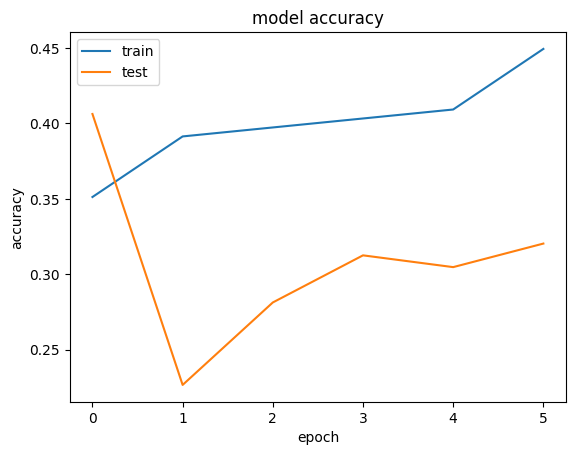

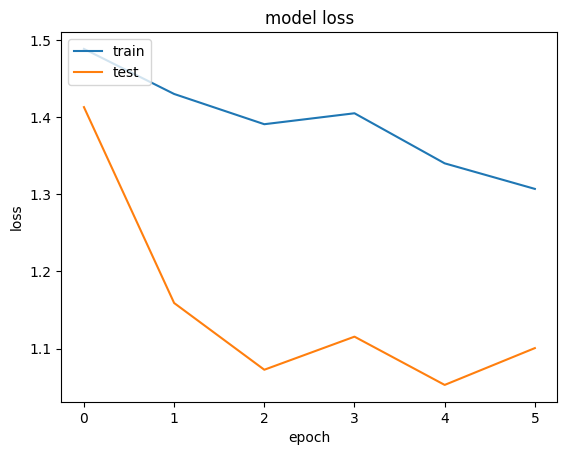

In [87]:
plotaccuracy(history8)

### Model 9 - CNN + LSTM

In [89]:
image_width = 100
image_height = 100
img_idx = [0,4,10,12,14,16,17,18,19,20,21,22,23,24,25,26,28,29]
number_ofinput_frames = len(img_idx)
batch_size = 32
num_epochs = 25
learning_rate = 0.001
input_shape = (number_ofinput_frames,image_width,image_height,3)

In [90]:
CNNlstm_2 = Sequential()

CNNlstm_2.add(TimeDistributed(Conv2D(16, (3, 3) , padding='same', activation='relu'),
                          input_shape=input_shape))
CNNlstm_2.add(TimeDistributed(BatchNormalization()))
CNNlstm_2.add(TimeDistributed(MaxPooling2D((2, 2))))

CNNlstm_2.add(TimeDistributed(Conv2D(32, (3, 3) , padding='same', activation='relu')))
CNNlstm_2.add(TimeDistributed(BatchNormalization()))
CNNlstm_2.add(TimeDistributed(MaxPooling2D((2, 2))))

CNNlstm_2.add(TimeDistributed(Conv2D(64, (3, 3) , padding='same', activation='relu')))
CNNlstm_2.add(TimeDistributed(BatchNormalization()))
CNNlstm_2.add(TimeDistributed(MaxPooling2D((2, 2))))

CNNlstm_2.add(TimeDistributed(Conv2D(128, (3, 3) , padding='same', activation='relu')))
CNNlstm_2.add(TimeDistributed(BatchNormalization()))
CNNlstm_2.add(TimeDistributed(MaxPooling2D((2, 2))))

CNNlstm_2.add(TimeDistributed(Conv2D(256, (3, 3) , padding='same', activation='relu')))
CNNlstm_2.add(TimeDistributed(BatchNormalization()))
CNNlstm_2.add(TimeDistributed(MaxPooling2D((2, 2))))

CNNlstm_2.add(TimeDistributed(Flatten()))


CNNlstm_2.add(LSTM(128))
CNNlstm_2.add(Dropout(0.25))

CNNlstm_2.add(Dense(128,activation='relu'))
CNNlstm_2.add(Dropout(0.25))

CNNlstm_2.add(Dense(5, activation='softmax'))


#write your optimizer
optimiser = optimizers.Adam()
#optimiser = 
#sgd = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.7, nesterov=True)

# compile model :
CNNlstm_2.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (CNNlstm_2.summary())

c:\Users\asthaagarwal\AppData\Local\anaconda3\envs\objectdetection\Lib\site-packages\keras\src\layers\core\wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ time_distributed_48             │ (None, 18, 100, 100,   │           448 │
│ (TimeDistributed)               │ 16)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_49             │ (None, 18, 100, 100,   │            64 │
│ (TimeDistributed)               │ 16)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_50             │ (None, 18, 50, 50, 16) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_51             │ (None, 18, 50, 50, 32) │         4,640 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_52             │ (None, 18, 50, 50, 32) │           128 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_53             │ (None, 18, 25, 25, 32) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_54             │ (None, 18, 25, 25, 64) │        18,496 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_55             │ (None, 18, 25, 25, 64) │           256 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_56             │ (None, 18, 12, 12, 64) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_57             │ (None, 18, 12, 12,     │        73,856 │
│ (TimeDistributed)               │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_58             │ (None, 18, 12, 12,     │           512 │
│ (TimeDistributed)               │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_59             │ (None, 18, 6, 6, 128)  │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_60             │ (None, 18, 6, 6, 256)  │       295,168 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_61             │ (None, 18, 6, 6, 256)  │         1,024 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_62             │ (None, 18, 3, 3, 256)  │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_63             │ (None, 18, 2304)       │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 128)            │     1,245,69

 Total params: 1,657,445 (6.32 MB)

 Trainable params: 1,656,453 (6.32 MB)

 Non-trainable params: 992 (3.88 KB)

None


In [91]:
# Lets initiate model training
history9 = train_model(CNNlstm_2,batch_size,img_idx,image_width,image_height,num_epochs)

Source path =  Project_data/train ; batch size = 32
Number of batches 20
Runing for batch 0
Runing for batch 1


In [ ]:
print("Validation Accuracy", history8.history['val_accuracy'][np.argmin(history8.history['val_loss'])])
print("Accuracy", history8.history['categorical_accuracy'][np.argmin(history8.history['loss'])])